In [1]:
# Local
import FeatureDetection
import OpticalFlow
import resources.image_interpolator as localWarper # type: ignore
import resources.dic_tools as dicTool # type: ignore

# Math
import numpy as np
import matplotlib.pyplot as plt

# Data
import cv2 as cv
import re

In [2]:
# Get image from file
file = 'Source/Vary Clouds (South Horizon)/#9 2024-04-08 13.05.13.png'
taken = re.findall(r'\d{4}-\d{2}-\d{2} \d{2}\.\d{2}\.\d{2}', file)[0]
cvImgs = cv.imread(file)
cvImg1, cvImg2 = np.hsplit(cvImgs, 2)
imgH, imgW, imgC = *cvImg1.shape[:2], 3

p1L, p2L, c1, c2, translation, rotation, center, angle = FeatureDetection.FeatureDetection(cvImg1, cvImg2)
p0 = np.array([np.repeat(range(imgW), imgH), np.tile(range(imgH), imgW)])

array([[ 2.040e+02, -3.119e-01,  1.634e-04, -2.039e-01,  5.018e-07,  1.629e-04],
       [-3.215e+01,  3.575e-02,  8.877e-07,  1.386e-02, -2.018e-05,  2.280e-06]])

array([[-2.094e+02,  3.218e-01, -1.691e-04,  2.063e-01,  1.247e-06, -1.666e-04],
       [ 4.265e+01, -5.040e-02,  6.526e-06, -2.627e-02,  2.076e-05,  7.196e-06]])

C:\Users\thta\AppData\Local\Temp\ipykernel_19460\1185691351.py:8: UserWarning: cmr10 font should ideally be used with mathtext, set axes.formatter.use_mathtext to True
  plt.axis('off')
C:\Users\thta\AppData\Local\Temp\ipykernel_19460\1185691351.py:15: UserWarning: cmr10 font should ideally be used with mathtext, set axes.formatter.use_mathtext to True
  plt.axis('off')


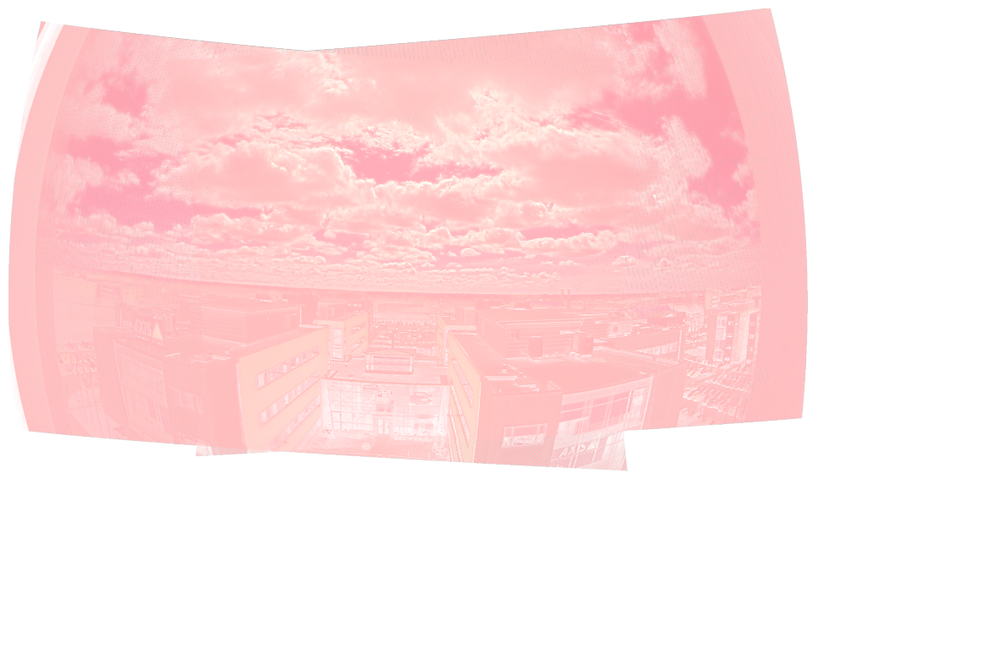

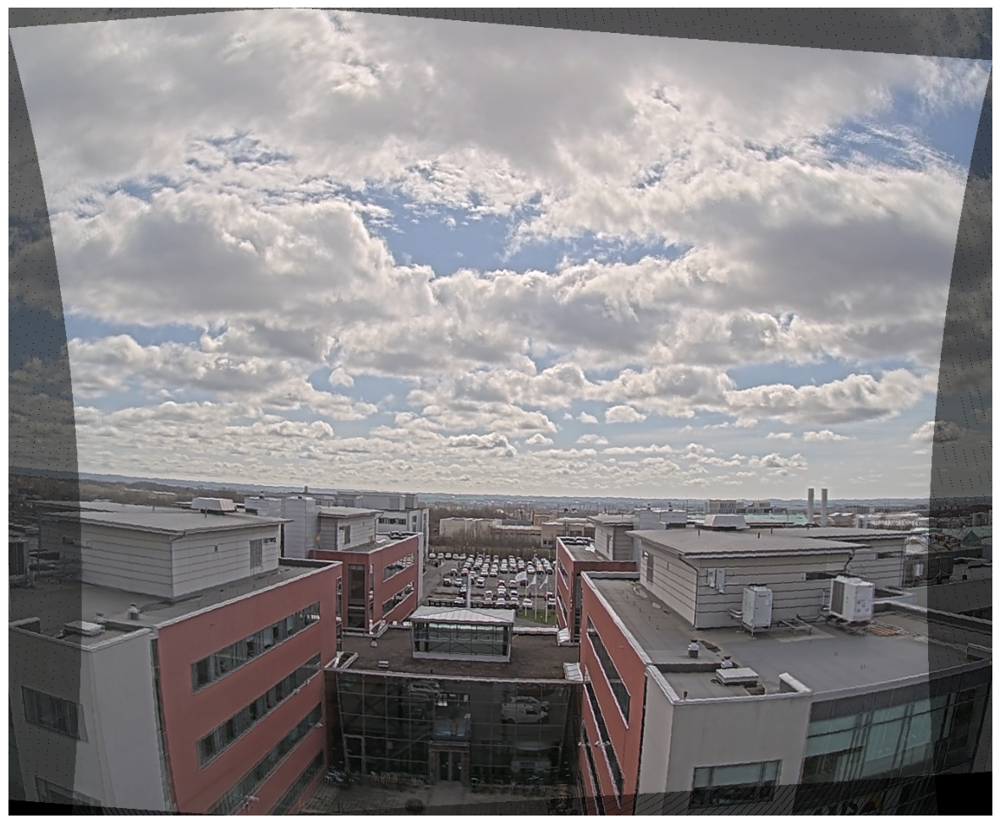

In [3]:
display(np.array(c1))
display(np.array(c2))

img, diff, overlap, pct, p1, p2 = localWarper.mergeAndWarpImages(p0, p0, np.array(c1), np.array(c2), [2], translation, rotation, center, FeatureDetection.maxCVal, imgC, [cvImg1, cvImg2])


plt.figure(figsize = (15,15))
plt.axis('off')
plt.imshow(((img)/np.max((img)))[:,:,::-1])

SuperOverLap = localWarper.refineAndConcatenateOverlaps(p0, p1, p2, imgC, [cvImg1, cvImg2])[:,:,::-1]
o1,o2 = np.split(SuperOverLap, 2, axis = 1)

plt.figure(figsize = (15,15))
plt.axis('off')
plt.imshow(((o1+o2)/np.max((o1+o2))))


In [4]:
OpticalFlow.debug = True
cOptical1, cOptical2 = OpticalFlow.OpticalFlow(o1/np.max((o1)), o2/np.max((o2)), ransac_tol=5)

Begining Optical Flow
Overlap Found
Begining Rolling window
Started at time: 2024-09-01 13.34.29


array([[ 2.042e+02, -3.143e-01,  1.669e-04, -2.033e-01, -3.497e-06,  1.655e-04],
       [-4.184e+01,  5.243e-02, -6.091e-06,  2.573e-02, -3.117e-05, -7.937e-07]])

array([[ 5.411e+00, -1.034e-02,  7.762e-06, -7.560e-03, -7.550e-07,  6.887e-06],
       [-8.734e+00,  1.823e-02, -8.833e-06,  1.072e-02, -1.247e-05, -2.465e-06]])

array([[-2.143e+02,  3.306e-01, -1.743e-04,  2.125e-01, -5.577e-07, -1.705e-04],
       [ 2.638e+01, -2.720e-02, -2.120e-06, -1.181e-02,  1.397e-05,  1.743e-06]])

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

/tmp/ipykernel_2240913/3597701435.py:13: UserWarning: cmr10 font should ideally be used with mathtext, set axes.formatter.use_mathtext to True
  plt.axis('off')
/tmp/ipykernel_2240913/3597701435.py:21: UserWarning: cmr10 font should ideally be used with mathtext, set axes.formatter.use_mathtext to True
  plt.axis('off')
/tmp/ipykernel_2240913/3597701435.py:25: UserWarning: cmr10 font should ideally be used with mathtext, set axes.formatter.use_mathtext to True
  plt.axis('off')
/tmp/ipykernel_2240913/3597701435.py:29: UserWarning: cmr10 font should ideally be used with mathtext, set axes.formatter.use_mathtext to True
  plt.axis('off')
/tmp/ipykernel_2240913/3597701435.py:32: UserWarning: cmr10 font should ideally be used with mathtext, set axes.formatter.use_mathtext to True
  plt.axis('off')


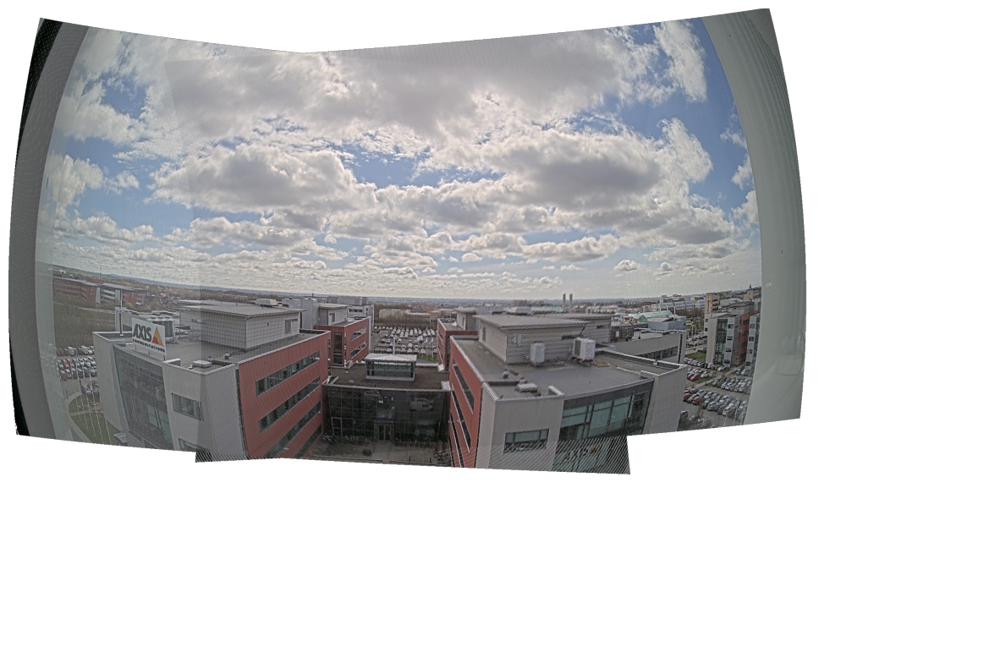

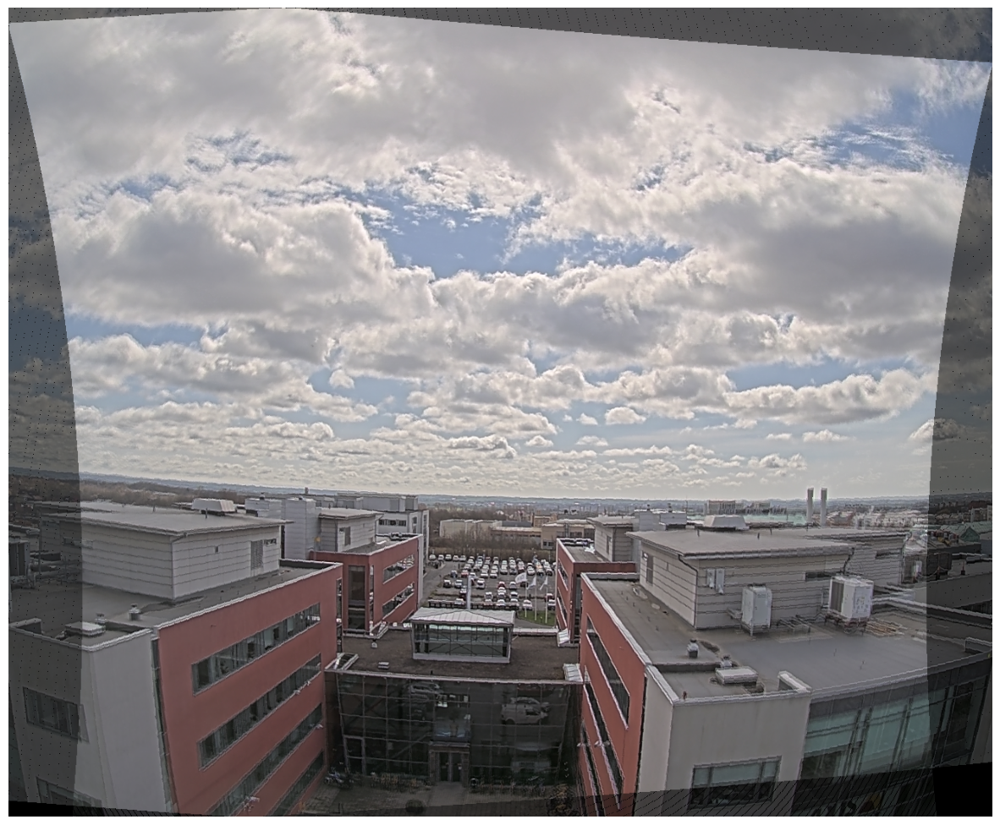

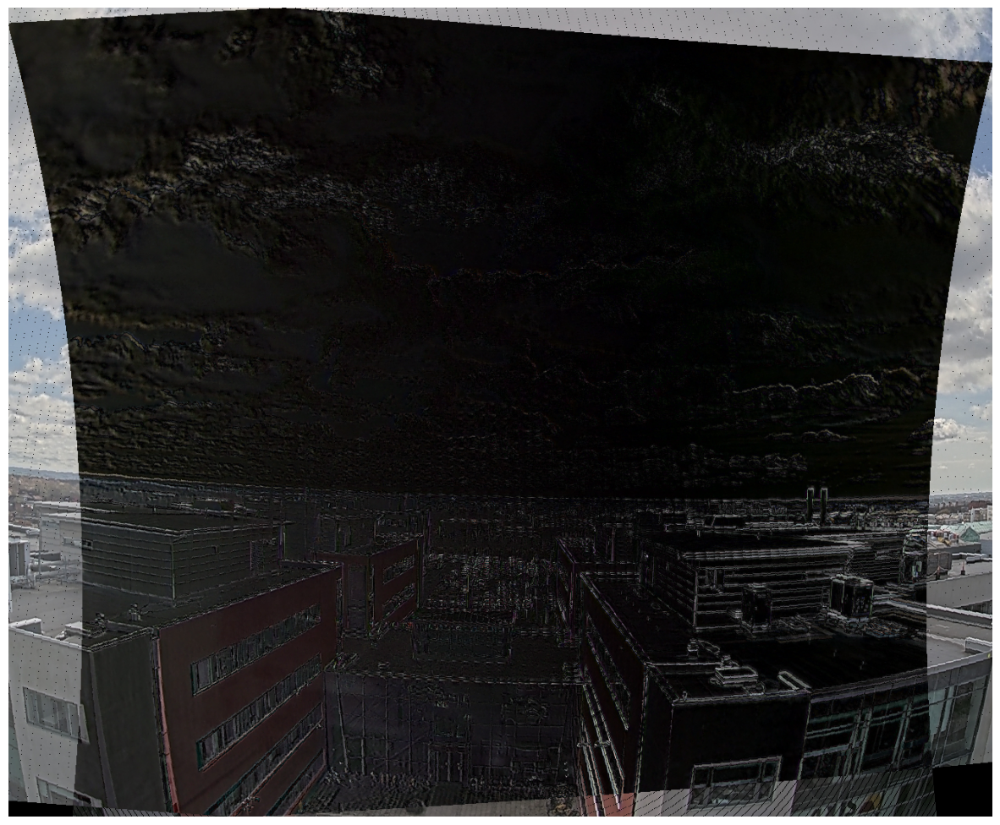

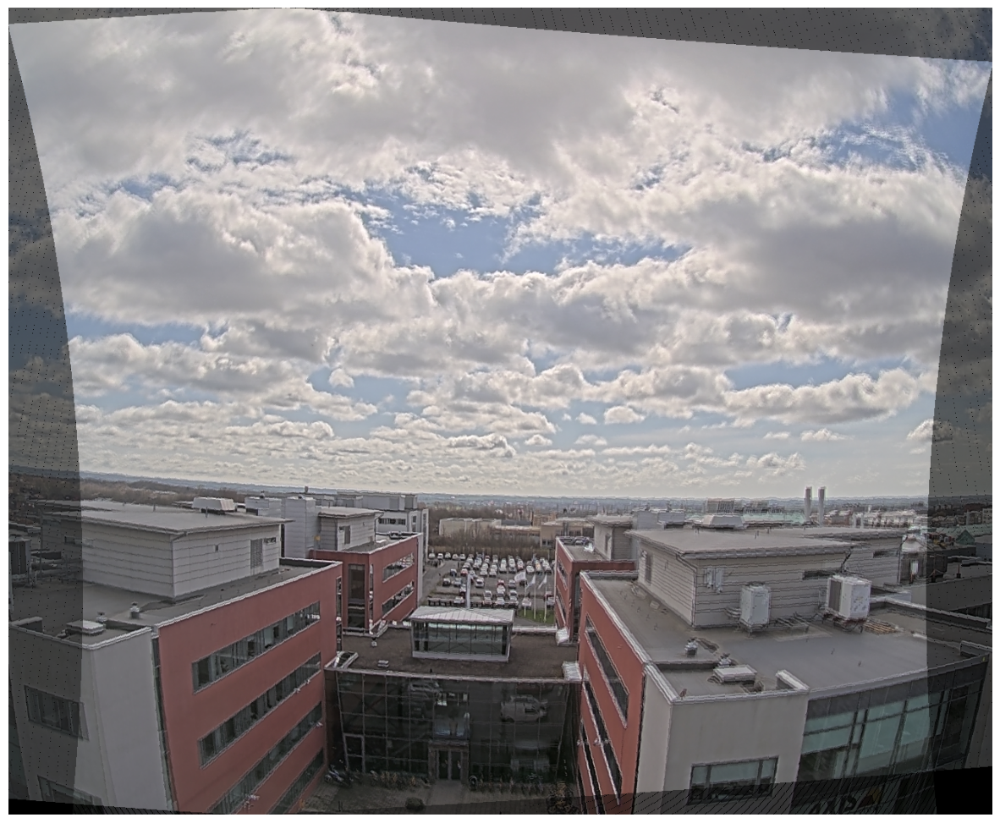

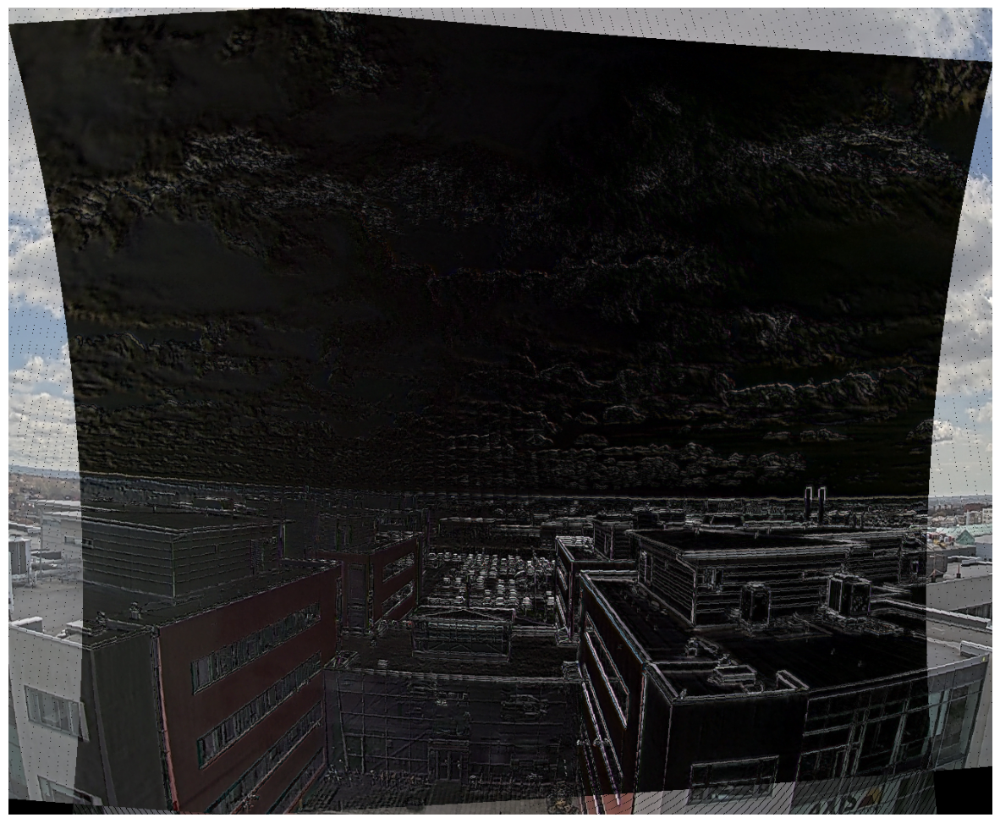

In [ ]:
c1o = np.array(c1) + cOptical1/2
display(np.array(c1o))
display(np.array(cOptical1))

c2o = np.array(c2) - cOptical1/2
display(np.array(c2o))

display(np.array(cOptical2))

img2, diff, overlap, pct, p1, p2 = localWarper.mergeAndWarpImages(p0, p0, c1o, c2o, [2], translation, rotation, center, FeatureDetection.maxCVal, imgC, [cvImg1[:,:,::-1], cvImg2[:,:,::-1]])

plt.figure(figsize = (15,15))
plt.axis('off')
plt.imshow(((img2)/np.max((img2))))

SuperOverLap = localWarper.refineAndConcatenateOverlaps(p0, p1, p2, imgC, [cvImg1, cvImg2])[:,:,::-1]
o1O,o2O = np.split(SuperOverLap, 2, axis = 1)


plt.figure(figsize = (15,15))
plt.axis('off')
plt.imshow(((o1+o2)/np.max((o1+o2))))

plt.figure(figsize = (15,15))
plt.axis('off')
plt.imshow((np.abs(o1-o2)/np.max(np.abs(o1-o2))))

plt.figure(figsize = (15,15))
plt.axis('off')
plt.imshow(((o1O+o2O)/np.max((o1O+o2O))))
plt.figure(figsize = (15,15))
plt.axis('off')
plt.imshow((np.abs(o1O-o2O)/np.max(np.abs(o1O-o2O))))

In [ ]:
display(c1o)
display(c1)

array([[ 2.042e+02, -3.143e-01,  1.669e-04, -2.033e-01, -3.497e-06,  1.655e-04],
       [-4.184e+01,  5.243e-02, -6.091e-06,  2.573e-02, -3.117e-05, -7.937e-07]])

[array([ 2.015e+02, -3.092e-01,  1.630e-04, -1.996e-01, -3.120e-06,  1.621e-04]),
 array([-3.747e+01,  4.332e-02, -1.675e-06,  2.037e-02, -2.494e-05,  4.388e-07])]

/tmp/ipykernel_2240913/2349948434.py:2: UserWarning: cmr10 font should ideally be used with mathtext, set axes.formatter.use_mathtext to True
  plt.axis('off')


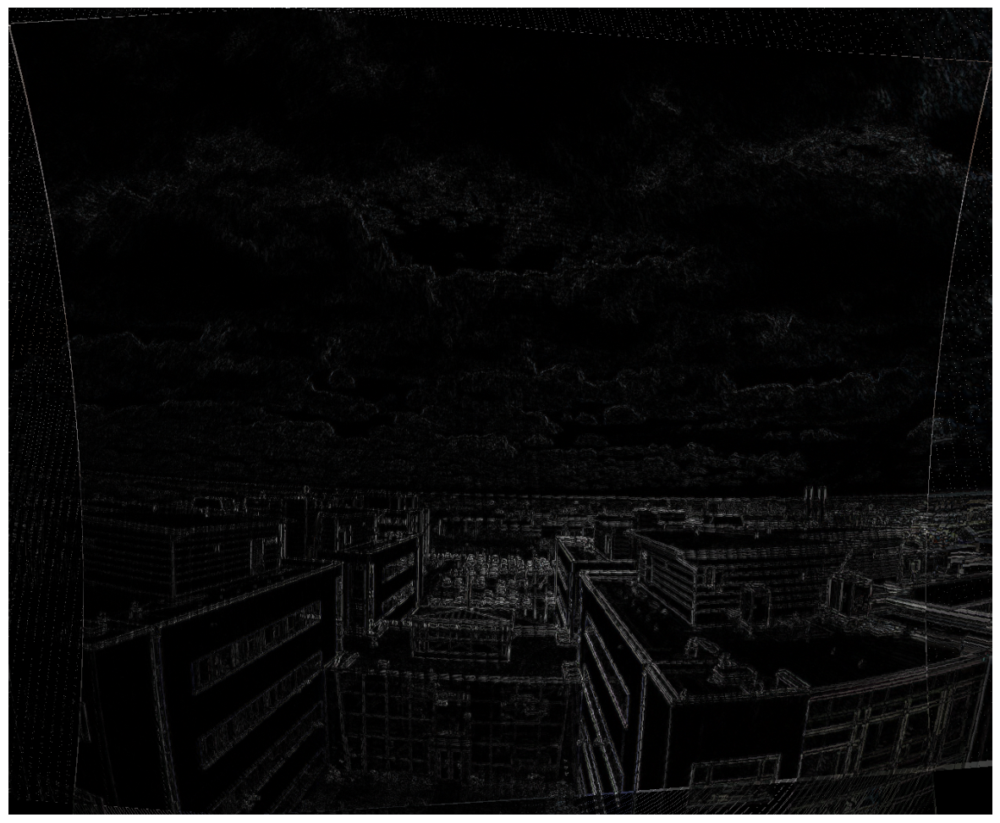

In [ ]:
plt.figure(figsize = (15,15))
plt.axis('off')
i1,i2 = dicTool.padItUp((o1+o2)[:,:,::-1] ,(o1O+o2O)[:,:,::-1] )
plt.imshow(np.abs(i1-i2)/np.max(np.abs(i1-i2)))
